In [1]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import os
import warnings


In [2]:
path = "D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/"

warnings.filterwarnings('ignore')

In [3]:
len(os.listdir(path))

120

In [4]:
dogs_labels = set()

    
for d in os.listdir(path):
    dogs_labels.add(d)

In [5]:
dogs_labels = list(dogs_labels)
dogs_labels_path = [path + s for s in dogs_labels]

In [6]:
import cv2
def load_and_preprocess_image(path):
    image = cv2.imread(path)
    image = cv2.resize(image, (224,224))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [7]:
X = []
y = []

for type_path, label in zip(dogs_labels_path,dogs_labels) :
    for image_path in os.listdir(type_path):
        image = load_and_preprocess_image(type_path+"/"+image_path)
        
        X.append(image)
        y.append(label)

In [8]:
from sklearn.preprocessing import LabelBinarizer
import numpy as np
encoder = LabelBinarizer()

X = np.array(X)
y = encoder.fit_transform(np.array(y))

In [9]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [10]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model, Sequential
from keras.utils.vis_utils import plot_model
base_model=VGG16(weights='imagenet',include_top=False)

x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x)
x=Dense(1024,activation='relu')(x)
x=Dropout(0.5)(x)
x=Dense(512,activation='relu')(x)
preds=Dense(len(dogs_labels),activation='softmax')(x)

model=Model(inputs=base_model.input,outputs=preds)

for layer in model.layers[:-5]:
    layer.trainable=False
for layer in model.layers[-5:]:
    layer.trainable=True
    
model.compile("adam",loss="categorical_crossentropy",metrics=["accuracy"])

print(model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [11]:
from keras.callbacks import ModelCheckpoint,EarlyStopping
from keras.optimizers import Adam,SGD
checkpoint = ModelCheckpoint(
    './base.model',
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min',
    save_weights_only=False,
    period=1
)
earlystop = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=30,
    verbose=1,
    mode='auto'
)

In [12]:
tf.config.experimental.get_memory_info('GPU:0')['current'] / 10**9

0.068873984

In [13]:
history = model.fit(X_train,y_train,batch_size=32,epochs=100,validation_data=(X_test,y_test), callbacks=[checkpoint,earlystop])

Epoch 1/100
515/515 [==============================] - ETA: 0s - loss: 3.2846 - accuracy: 0.2196
Epoch 1: val_loss improved from inf to 2.29296, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


515/515 [==============================] - 49s 53ms/step - loss: 3.2846 - accuracy: 0.2196 - val_loss: 2.2930 - val_accuracy: 0.3793
Epoch 2/100
514/515 [============================>.] - ETA: 0s - loss: 2.1856 - accuracy: 0.3968
Epoch 2: val_loss improved from 2.29296 to 1.98430, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


515/515 [==============================] - 26s 51ms/step - loss: 2.1850 - accuracy: 0.3969 - val_loss: 1.9843 - val_accuracy: 0.4517
Epoch 3/100
515/515 [==============================] - ETA: 0s - loss: 1.8715 - accuracy: 0.4732
Epoch 3: val_loss improved from 1.98430 to 1.87126, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


515/515 [==============================] - 27s 53ms/step - loss: 1.8715 - accuracy: 0.4732 - val_loss: 1.8713 - val_accuracy: 0.4803
Epoch 4/100
515/515 [==============================] - ETA: 0s - loss: 1.6694 - accuracy: 0.5149
Epoch 4: val_loss improved from 1.87126 to 1.85269, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


515/515 [==============================] - 26s 50ms/step - loss: 1.6694 - accuracy: 0.5149 - val_loss: 1.8527 - val_accuracy: 0.4815
Epoch 5/100
515/515 [==============================] - ETA: 0s - loss: 1.5336 - accuracy: 0.5538
Epoch 5: val_loss improved from 1.85269 to 1.81919, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


515/515 [==============================] - 26s 50ms/step - loss: 1.5336 - accuracy: 0.5538 - val_loss: 1.8192 - val_accuracy: 0.4898
Epoch 6/100
515/515 [==============================] - ETA: 0s - loss: 1.3939 - accuracy: 0.5861
Epoch 6: val_loss did not improve from 1.81919
515/515 [==============================] - 25s 48ms/step - loss: 1.3939 - accuracy: 0.5861 - val_loss: 1.8492 - val_accuracy: 0.4964
Epoch 7/100
515/515 [==============================] - ETA: 0s - loss: 1.2991 - accuracy: 0.6115
Epoch 7: val_loss did not improve from 1.81919
515/515 [==============================] - 25s 48ms/step - loss: 1.2991 - accuracy: 0.6115 - val_loss: 1.8856 - val_accuracy: 0.4988
Epoch 8/100
515/515 [==============================] - ETA: 0s - loss: 1.2100 - accuracy: 0.6394
Epoch 8: val_loss did not improve from 1.81919
515/515 [==============================] - 25s 48ms/step - loss: 1.2100 - accuracy: 0.6394 - val_loss: 1.8439 - val_accuracy: 0.5221
Epoch 9/100
515/515 [===============

Epoch 35/100
515/515 [==============================] - ETA: 0s - loss: 0.5671 - accuracy: 0.8439
Epoch 35: val_loss did not improve from 1.81919
515/515 [==============================] - 26s 50ms/step - loss: 0.5671 - accuracy: 0.8439 - val_loss: 3.0308 - val_accuracy: 0.5175
Epoch 35: early stopping


In [14]:
predictions = model.predict(X_test)

129/129 [==============================] - 5s 39ms/step


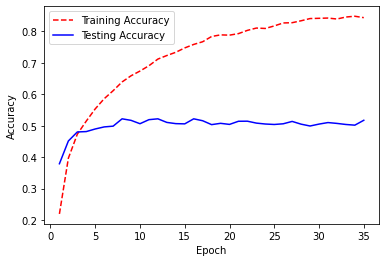

In [15]:
#lets plot the cross validation error as we perform more epochs

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Create count of the number of epochs
epoch_count = range(1, len(accuracy) + 1)

# Visualize loss history
plt.plot(epoch_count, accuracy, 'r--')
plt.plot(epoch_count, val_accuracy, 'b-')
plt.legend(['Training Accuracy', 'Testing Accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.savefig('accuracy.jpg')
plt.show();

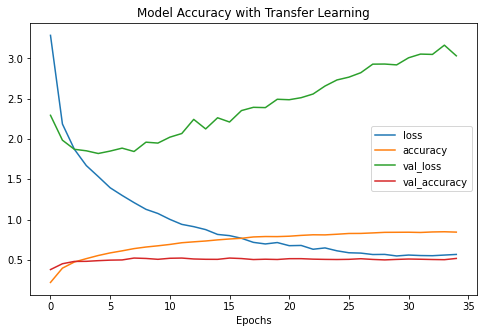

In [16]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.title("Model Accuracy with Transfer Learning")
plt.xlabel("Epochs")
plt.savefig('model_accuracy.jpg')
plt.show()

In [17]:
label_predictions = encoder.inverse_transform(predictions)

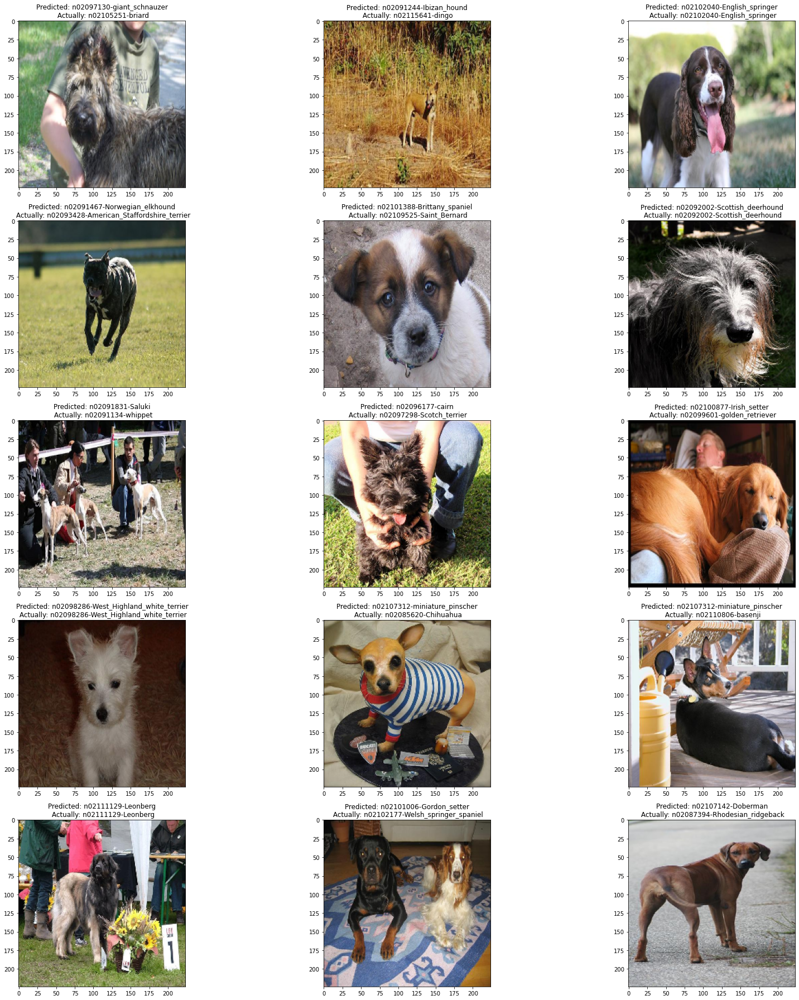

In [18]:
rows, cols = 5, 3
size = 25

fig,ax=plt.subplots(rows,cols)
fig.set_size_inches(size,size)
for i in range(rows):
    for j in range (cols):
        index = np.random.randint(0,len(X_test))
        ax[i,j].imshow(X_test[index])
        ax[i,j].set_title(f'Predicted: {label_predictions[index]}\n Actually: {encoder.inverse_transform(y_test)[index]}')
        
plt.tight_layout()
plt.savefig('img_pred_2.png')

In [20]:
''''
DATADIR = "D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/"
CATEGORIES = ["n02085620-Chihuahua", "n02085782-Japanese_spaniel", "n02085936-Maltese_dog", "n02086079-Pekinese", "n02086240-Shih-Tzu",
             "n02086646-Blenheim_spaniel", "n02086910-papillon", "n02087046-toy_terrier", "n02087394-Rhodesian_ridgeback", "n02088094-Afghan_hound",
             "n02088238-basset", "n02088364-beagle", "n02088466-bloodhound", "n02088632-bluetick", "n02089078-black-and-tan_coonhound", "n02089867-Walker_hound",
             "n02089973-English_foxhound", "n02090379-redbone", "n02090622-borzoi", "n02090721-Irish_wolfhound", "n02091032-Italian_greyhound", "n02091032-Italian_greyhound",
             "n02091244-Ibizan_hound", "n02091467-Norwegian_elkhound", "n02091635-otterhound", "n02091831-Saluki", "n02092002-Scottish_deerhound",
             "n02092339-Weimaraner", "n02093256-Staffordshire_bullterrier", "n02093428-American_Staffordshire_terrier",
             "n02093647-Bedlington_terrier", "n02093754-Border_terrier", "n02093859-Kerry_blue_terrier", "n02093991-Irish_terrier",
             "n02094114-Norfolk_terrier", "n02094258-Norwich_terrier", "n02094433-Yorkshire_terrier", "n02095314-wire-haired_fox_terrier",
             "n02095570-Lakeland_terrier", "n02095889-Sealyham_terrier", "n02096051-Airedale", "n02096177-cairn", "n02096294-Australian_terrier", "n02096437-Dandie_Dinmont",
             "n02096585-Boston_bull", "n02097047-miniature_schnauzer", "n02097130-giant_schnauzer", "n02097209-standard_schnauzer", "n02097298-Scotch_terrier", "n02097474-Tibetan_terrier",
             "n02097658-silky_terrier", "n02098105-soft-coated_wheaten_terrier", "n02098286-West_Highland_white_terrier",
             "n02098413-Lhasa", "n02099267-flat-coated_retriever", "n02099429-curly-coated_retriever", "n02099601-golden_retriever",
             "n02099712-Labrador_retriever", "n02099849-Chesapeake_Bay_retriever", "n02100236-German_short-haired_pointer",
             "n02100583-vizsla", "n02100735-English_setter", "n02100877-Irish_setter", "n02101006-Gordon_setter", "n02101388-Brittany_spaniel",
             "n02101556-clumber", "n02102040-English_springer", "n02102177-Welsh_springer_spaniel", "n02102318-cocker_spaniel", "n02102480-Sussex_spaniel",
             "n02102973-Irish_water_spaniel", "n02104029-kuvasz", "n02104365-schipperke", "n02105056-groenendael", "n02105162-malinois", "n02105251-briard", "n02105412-kelpie",
             "n02105505-komondor", "n02105641-Old_English_sheepdog", "n02105855-Shetland_sheepdog", "n02106030-collie", "n02106166-Border_collie", "n02106382-Bouvier_des_Flandres",
             "n02106550-Rottweiler", "n02106662-German_shepherd", "n02107142-Doberman", "n02107312-miniature_pinscher", "n02107574-Greater_Swiss_Mountain_dog",
             "n02107683-Bernese_mountain_dog", "n02107908-Appenzeller", "n02108000-EntleBucher", "n02108089-boxer", "n02108422-bull_mastiff", "n02108551-Tibetan_mastiff", 
             "n02108915-French_bulldog", "n02109047-Great_Dane", "n02109525-Saint_Bernard", "n02109961-Eskimo_dog", "n02110063-malamute", "n02110185-Siberian_husky",
             "n02110627-affenpinscher", "n02110806-basenji", "n02110958-pug", "n02111129-Leonberg", "n02111277-Newfoundland", "n02111500-Great_Pyrenees", "n02111889-Samoyed",
             "n02112018-Pomeranian", "n02112137-chow", "n02112350-keeshond", "n02112706-Brabancon_griffon", "n02113023-Pembroke", "n02113186-Cardigan", "n02113624-toy_poodle",
             "n02113712-miniature_poodle", "n02113799-standard_poodle", "n02113978-Mexican_hairless", "n02115641-dingo", "n02115913-dhole", 
             "n02116738-African_hunting_dog"]
''''             

SyntaxError: unterminated string literal (detected at line 27) (4258290484.py, line 27)

In [21]:
''''
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

for category in CATEGORIES:
    path = os.path.join(DATADIR, category) # path to dogs dir
    #for img in os.listdir(path):
    for img in os.listdir(path):
        img_array = cv2.imread(os.path.join(path,img))
        #img = load_img(path)
        #x = img_to_array(img)
        x = img_array
        x = x.reshape((1,) + x.shape)
        dirsave = "D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images_Augmented/" + category
        i = 0
        for batch in datagen.flow(x, batch_size=1, save_to_dir=dirsave, save_format='jpg'):
            i += 1
            if i > 10:
                break
        
        #plt.imshow(img_array)
        #plt.show()
        #break
    #break
''''    

SyntaxError: unterminated string literal (detected at line 34) (2030986289.py, line 34)

In [22]:
path_aug = "D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images_Augmented/"
len(os.listdir(path_aug))

120

In [23]:
dogs_labels_aug = set()

for d in os.listdir(path_aug):
    dogs_labels_aug.add(d)

In [24]:
dogs_labels_aug = list(dogs_labels_aug)[:10]
dogs_labels_aug_path = [path + s for s in dogs_labels_aug]

In [25]:
dogs_labels_aug_path

['D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02101006-Gordon_setter',
 'D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02108089-boxer',
 'D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02097658-silky_terrier',
 'D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02099712-Labrador_retriever',
 'D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02102318-cocker_spaniel',
 'D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02108422-bull_mastiff',
 'D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02100877-Irish_setter',
 'D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02113023-Pembroke',
 'D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02088632-bluetick',
 'D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Images/Images/n02090721-Irish_wolfhound']

In [26]:
def load_and_preprocess_image(path_aug):
    image = cv2.imread(path_aug)
    image = cv2.resize(image, (224,224))
    return image

In [27]:
X_aug = []
y_aug = []

for type_path, label in zip(dogs_labels_aug_path,dogs_labels_aug) :
    for image_path in os.listdir(type_path):
        image = load_and_preprocess_image(type_path+"/"+image_path)
        
        X_aug.append(image)
        y_aug.append(label)

X_aug = np.array(X_aug)
X_aug =X_aug/255
y_aug = encoder.fit_transform(np.array(y_aug))        

In [28]:
X_aug_train, X_aug_test, y_aug_train, y_aug_test = train_test_split(X_aug,y_aug,test_size=0.2)

In [29]:
checkpoint_aug = ModelCheckpoint(
    './base.model',
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min',
    save_weights_only=False,
    period=1
)
earlystop_aug = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=30,
    verbose=1,
    mode='auto'
)

In [30]:
tf.config.experimental.get_memory_info('GPU:0')['current'] / 10**9

0.088494336

In [31]:
base_model=VGG16(weights='imagenet',include_top=False)

x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x)
x=Dense(1024,activation='relu')(x)
x=Dropout(0.5)(x)
x=Dense(512,activation='relu')(x)
preds=Dense(10,activation='softmax')(x)

model=Model(inputs=base_model.input,outputs=preds)

for layer in model.layers[:-5]:
    layer.trainable=False
for layer in model.layers[-5:]:
    layer.trainable=True
    
model.compile("adam",loss="categorical_crossentropy",metrics=["accuracy"])

print(model.summary())

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0   

In [32]:
history_aug = model.fit(X_aug_train,y_aug_train,batch_size=32,epochs=100,validation_data=(X_aug_test,y_aug_test), callbacks=[checkpoint_aug,earlystop_aug])

Epoch 1/100
43/43 [==============================] - ETA: 0s - loss: 2.2646 - accuracy: 0.1819
Epoch 1: val_loss improved from inf to 1.93394, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


43/43 [==============================] - 4s 92ms/step - loss: 2.2646 - accuracy: 0.1819 - val_loss: 1.9339 - val_accuracy: 0.3206
Epoch 2/100
43/43 [==============================] - ETA: 0s - loss: 1.7264 - accuracy: 0.3859
Epoch 2: val_loss improved from 1.93394 to 1.49023, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


43/43 [==============================] - 3s 79ms/step - loss: 1.7264 - accuracy: 0.3859 - val_loss: 1.4902 - val_accuracy: 0.4176
Epoch 3/100
43/43 [==============================] - ETA: 0s - loss: 1.3213 - accuracy: 0.5125
Epoch 3: val_loss improved from 1.49023 to 1.36001, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


43/43 [==============================] - 3s 78ms/step - loss: 1.3213 - accuracy: 0.5125 - val_loss: 1.3600 - val_accuracy: 0.5206
Epoch 4/100
43/43 [==============================] - ETA: 0s - loss: 1.1415 - accuracy: 0.6053
Epoch 4: val_loss improved from 1.36001 to 1.30887, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


43/43 [==============================] - 3s 80ms/step - loss: 1.1415 - accuracy: 0.6053 - val_loss: 1.3089 - val_accuracy: 0.5794
Epoch 5/100
43/43 [==============================] - ETA: 0s - loss: 0.9672 - accuracy: 0.6568
Epoch 5: val_loss improved from 1.30887 to 1.14408, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


43/43 [==============================] - 3s 78ms/step - loss: 0.9672 - accuracy: 0.6568 - val_loss: 1.1441 - val_accuracy: 0.6000
Epoch 6/100
43/43 [==============================] - ETA: 0s - loss: 0.7979 - accuracy: 0.7231
Epoch 6: val_loss improved from 1.14408 to 1.08600, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


43/43 [==============================] - 3s 81ms/step - loss: 0.7979 - accuracy: 0.7231 - val_loss: 1.0860 - val_accuracy: 0.6088
Epoch 7/100
42/43 [============================>.] - ETA: 0s - loss: 0.7552 - accuracy: 0.7202
Epoch 7: val_loss improved from 1.08600 to 0.99311, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


43/43 [==============================] - 3s 81ms/step - loss: 0.7551 - accuracy: 0.7202 - val_loss: 0.9931 - val_accuracy: 0.6706
Epoch 8/100
43/43 [==============================] - ETA: 0s - loss: 0.6427 - accuracy: 0.7842
Epoch 8: val_loss improved from 0.99311 to 0.97381, saving model to .\base.model


INFO:tensorflow:Assets written to: .\base.model\assets


INFO:tensorflow:Assets written to: .\base.model\assets


43/43 [==============================] - 3s 79ms/step - loss: 0.6427 - accuracy: 0.7842 - val_loss: 0.9738 - val_accuracy: 0.6971
Epoch 9/100
43/43 [==============================] - ETA: 0s - loss: 0.5819 - accuracy: 0.7997
Epoch 9: val_loss did not improve from 0.97381
43/43 [==============================] - 2s 51ms/step - loss: 0.5819 - accuracy: 0.7997 - val_loss: 1.0789 - val_accuracy: 0.6765
Epoch 10/100
43/43 [==============================] - ETA: 0s - loss: 0.5521 - accuracy: 0.7982
Epoch 10: val_loss did not improve from 0.97381
43/43 [==============================] - 2s 51ms/step - loss: 0.5521 - accuracy: 0.7982 - val_loss: 1.0629 - val_accuracy: 0.6647
Epoch 11/100
43/43 [==============================] - ETA: 0s - loss: 0.4459 - accuracy: 0.8365
Epoch 11: val_loss did not improve from 0.97381
43/43 [==============================] - 2s 53ms/step - loss: 0.4459 - accuracy: 0.8365 - val_loss: 1.1847 - val_accuracy: 0.6471
Epoch 12/100
43/43 [==============================

43/43 [==============================] - 2s 53ms/step - loss: 0.0938 - accuracy: 0.9654 - val_loss: 2.0696 - val_accuracy: 0.6588
Epoch 38: early stopping


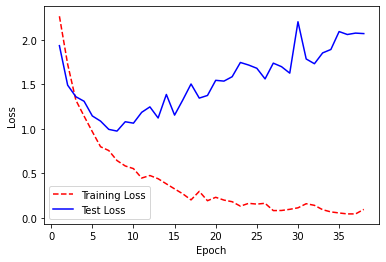

In [33]:
#lets plot the cross validation error as we perform more epochs

training_loss = history_aug.history['loss']
test_loss = history_aug.history['val_loss']

# Create count of the number of epochs
epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_loss, 'r--')
plt.plot(epoch_count, test_loss, 'b-')
plt.legend(['Training Loss', 'Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show();

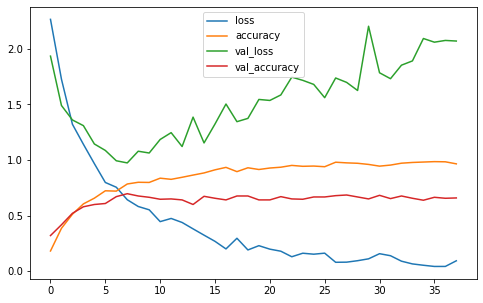

In [34]:
pd.DataFrame(history_aug.history).plot(figsize=(8,5))
plt.show()

In [35]:
predictions_aug = model.predict(X_aug_test)
label_aug_predictions = encoder.inverse_transform(predictions_aug)

11/11 [==============================] - 0s 39ms/step


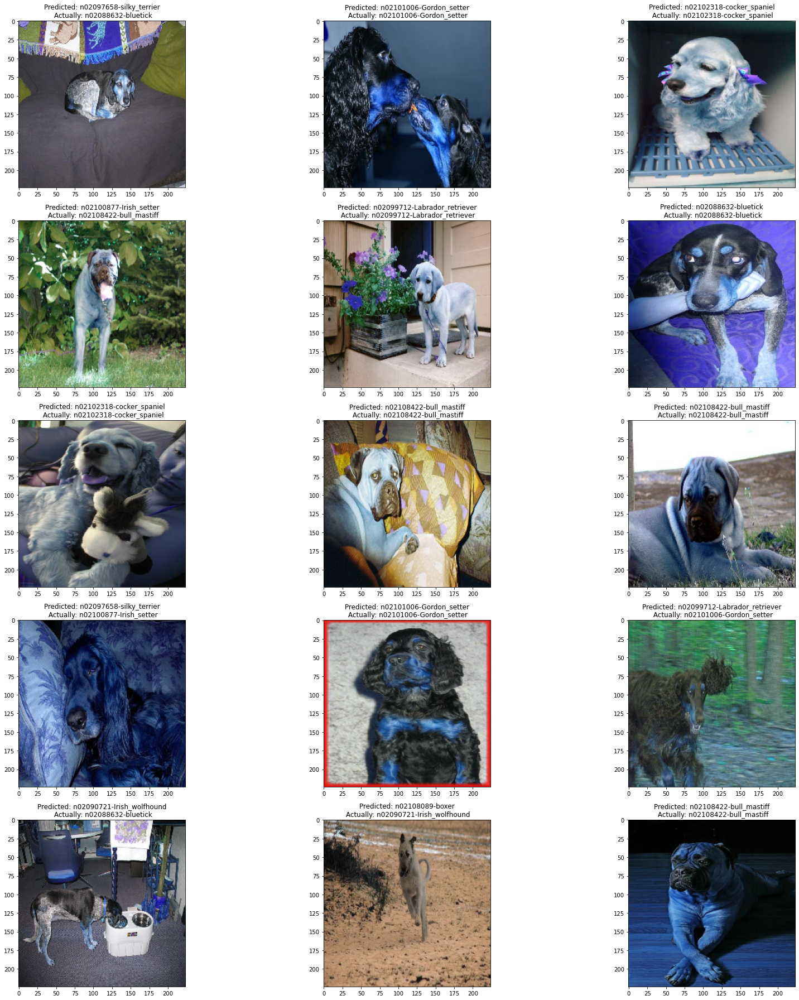

In [36]:
rows, cols = 5, 3
size = 25

fig,ax=plt.subplots(rows,cols)
fig.set_size_inches(size,size)
for i in range(rows):
    for j in range (cols):
        index = np.random.randint(0,len(X_aug_test))
        ax[i,j].imshow(X_aug_test[index])
        ax[i,j].set_title(f'Predicted: {label_aug_predictions[index]}\n Actually: {encoder.inverse_transform(y_aug_test)[index]}')
        
plt.tight_layout()

In [37]:
dropOut = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.9]
Errors = []

In [38]:
for d in dropOut:
    base_model=VGG16(weights='imagenet',include_top=False)
    x=base_model.output
    x=GlobalAveragePooling2D()(x)
    x=Dense(1024,activation='relu')(x)
    x=Dense(1024,activation='relu')(x)
    x=Dropout(d)(x)
    x=Dense(512,activation='relu')(x)
    preds=Dense(10,activation='softmax')(x)
    
    model=Model(inputs=base_model.input,outputs=preds)
    
    for layer in model.layers[:-5]:
        layer.trainable=False
    for layer in model.layers[-5:]:
        layer.trainable=True
        
    model.compile("adam",loss="categorical_crossentropy",metrics=["accuracy"])
    history_aug = model.fit(X_aug_train,y_aug_train,batch_size=32,epochs=100,validation_data=(X_aug_test,y_aug_test), callbacks=[earlystop_aug])
    training_loss = history_aug.history['val_accuracy'][-1]
    Errors.append(1-training_loss)

Epoch 1/100
43/43 [==============================] - 3s 57ms/step - loss: 2.1471 - accuracy: 0.2231 - val_loss: 1.7529 - val_accuracy: 0.3265
Epoch 2/100
43/43 [==============================] - 2s 52ms/step - loss: 1.4933 - accuracy: 0.4654 - val_loss: 1.3673 - val_accuracy: 0.5382
Epoch 3/100
43/43 [==============================] - 2s 52ms/step - loss: 1.1444 - accuracy: 0.6024 - val_loss: 1.1375 - val_accuracy: 0.6176
Epoch 4/100
43/43 [==============================] - 2s 52ms/step - loss: 0.9050 - accuracy: 0.6937 - val_loss: 1.0827 - val_accuracy: 0.6118
Epoch 5/100
43/43 [==============================] - 2s 51ms/step - loss: 0.7652 - accuracy: 0.7445 - val_loss: 1.0845 - val_accuracy: 0.6382
Epoch 6/100
43/43 [==============================] - 2s 51ms/step - loss: 0.6989 - accuracy: 0.7504 - val_loss: 1.1644 - val_accuracy: 0.6118
Epoch 7/100
43/43 [==============================] - 2s 52ms/step - loss: 0.4978 - accuracy: 0.8328 - val_loss: 1.1530 - val_accuracy: 0.6529
Epoch 

43/43 [==============================] - 2s 53ms/step - loss: 0.0568 - accuracy: 0.9831 - val_loss: 1.6099 - val_accuracy: 0.6941
Epoch 25/100
43/43 [==============================] - 2s 54ms/step - loss: 0.1955 - accuracy: 0.9367 - val_loss: 1.9329 - val_accuracy: 0.6529
Epoch 26/100
43/43 [==============================] - 2s 54ms/step - loss: 0.1257 - accuracy: 0.9514 - val_loss: 1.9169 - val_accuracy: 0.6559
Epoch 27/100
43/43 [==============================] - 2s 54ms/step - loss: 0.1617 - accuracy: 0.9433 - val_loss: 1.7557 - val_accuracy: 0.6647
Epoch 28/100
43/43 [==============================] - 2s 53ms/step - loss: 0.0763 - accuracy: 0.9786 - val_loss: 1.7817 - val_accuracy: 0.6647
Epoch 29/100
43/43 [==============================] - 2s 53ms/step - loss: 0.0385 - accuracy: 0.9890 - val_loss: 1.7791 - val_accuracy: 0.6882
Epoch 30/100
43/43 [==============================] - 2s 54ms/step - loss: 0.0105 - accuracy: 0.9993 - val_loss: 1.8929 - val_accuracy: 0.6912
Epoch 31/100

43/43 [==============================] - 2s 51ms/step - loss: 0.5316 - accuracy: 0.8218 - val_loss: 1.1727 - val_accuracy: 0.6500
Epoch 10/100
43/43 [==============================] - 2s 51ms/step - loss: 0.5039 - accuracy: 0.8211 - val_loss: 1.2199 - val_accuracy: 0.6353
Epoch 11/100
43/43 [==============================] - 2s 51ms/step - loss: 0.4107 - accuracy: 0.8520 - val_loss: 1.3450 - val_accuracy: 0.6353
Epoch 12/100
43/43 [==============================] - 2s 51ms/step - loss: 0.3971 - accuracy: 0.8586 - val_loss: 1.2502 - val_accuracy: 0.6324
Epoch 13/100
43/43 [==============================] - 2s 51ms/step - loss: 0.3891 - accuracy: 0.8630 - val_loss: 1.1343 - val_accuracy: 0.6647
Epoch 14/100
43/43 [==============================] - 2s 51ms/step - loss: 0.3124 - accuracy: 0.8918 - val_loss: 1.2414 - val_accuracy: 0.6412
Epoch 15/100
43/43 [==============================] - 2s 51ms/step - loss: 0.2316 - accuracy: 0.9330 - val_loss: 1.2225 - val_accuracy: 0.6647
Epoch 16/100

43/43 [==============================] - 2s 51ms/step - loss: 0.1082 - accuracy: 0.9573 - val_loss: 1.8157 - val_accuracy: 0.6765
Epoch 29/100
43/43 [==============================] - 2s 51ms/step - loss: 0.0685 - accuracy: 0.9764 - val_loss: 2.1316 - val_accuracy: 0.6382
Epoch 30/100
43/43 [==============================] - 2s 51ms/step - loss: 0.0534 - accuracy: 0.9860 - val_loss: 3.0049 - val_accuracy: 0.5941
Epoch 31/100
43/43 [==============================] - 2s 51ms/step - loss: 0.2207 - accuracy: 0.9271 - val_loss: 2.2956 - val_accuracy: 0.5912
Epoch 32/100
43/43 [==============================] - 2s 51ms/step - loss: 0.1570 - accuracy: 0.9462 - val_loss: 1.8959 - val_accuracy: 0.6618
Epoch 33/100
43/43 [==============================] - 2s 51ms/step - loss: 0.0760 - accuracy: 0.9735 - val_loss: 1.8696 - val_accuracy: 0.6853
Epoch 34/100
43/43 [==============================] - 2s 51ms/step - loss: 0.0584 - accuracy: 0.9838 - val_loss: 2.1031 - val_accuracy: 0.6765
Epoch 35/100

43/43 [==============================] - 2s 51ms/step - loss: 0.6947 - accuracy: 0.7636 - val_loss: 1.0649 - val_accuracy: 0.6441
Epoch 9/100
43/43 [==============================] - 2s 51ms/step - loss: 0.6137 - accuracy: 0.7879 - val_loss: 1.2149 - val_accuracy: 0.5971
Epoch 10/100
43/43 [==============================] - 2s 51ms/step - loss: 0.6159 - accuracy: 0.7784 - val_loss: 0.9770 - val_accuracy: 0.6971
Epoch 11/100
43/43 [==============================] - 2s 51ms/step - loss: 0.5525 - accuracy: 0.8056 - val_loss: 1.0373 - val_accuracy: 0.6853
Epoch 12/100
43/43 [==============================] - 2s 52ms/step - loss: 0.4573 - accuracy: 0.8424 - val_loss: 1.2493 - val_accuracy: 0.6559
Epoch 13/100
43/43 [==============================] - 2s 52ms/step - loss: 0.4615 - accuracy: 0.8454 - val_loss: 1.2358 - val_accuracy: 0.6588
Epoch 14/100
43/43 [==============================] - 2s 52ms/step - loss: 0.4371 - accuracy: 0.8557 - val_loss: 1.2478 - val_accuracy: 0.6441
Epoch 15/100


43/43 [==============================] - 2s 52ms/step - loss: 0.2020 - accuracy: 0.9315 - val_loss: 1.3097 - val_accuracy: 0.6941
Epoch 26/100
43/43 [==============================] - 2s 52ms/step - loss: 0.1679 - accuracy: 0.9418 - val_loss: 1.7581 - val_accuracy: 0.6500
Epoch 27/100
43/43 [==============================] - 2s 52ms/step - loss: 0.2483 - accuracy: 0.9080 - val_loss: 1.4157 - val_accuracy: 0.6618
Epoch 28/100
43/43 [==============================] - 2s 52ms/step - loss: 0.1628 - accuracy: 0.9492 - val_loss: 1.4538 - val_accuracy: 0.6647
Epoch 29/100
43/43 [==============================] - 2s 52ms/step - loss: 0.1481 - accuracy: 0.9543 - val_loss: 1.7072 - val_accuracy: 0.6588
Epoch 30/100
43/43 [==============================] - 2s 52ms/step - loss: 0.1727 - accuracy: 0.9374 - val_loss: 1.6475 - val_accuracy: 0.6559
Epoch 31/100
43/43 [==============================] - 2s 52ms/step - loss: 0.0985 - accuracy: 0.9654 - val_loss: 1.7904 - val_accuracy: 0.6500
Epoch 32/100

43/43 [==============================] - 2s 52ms/step - loss: 0.1855 - accuracy: 0.9330 - val_loss: 1.5177 - val_accuracy: 0.6647
Epoch 42/100
43/43 [==============================] - 2s 52ms/step - loss: 0.1928 - accuracy: 0.9323 - val_loss: 1.6318 - val_accuracy: 0.7000
Epoch 43/100
43/43 [==============================] - 2s 52ms/step - loss: 0.1625 - accuracy: 0.9440 - val_loss: 1.7724 - val_accuracy: 0.6529
Epoch 43: early stopping


In [39]:
Errors

[0.32058823108673096,
 0.31470590829849243,
 0.30000001192092896,
 0.3441176414489746,
 0.32941174507141113,
 0.3117647171020508,
 0.32647061347961426,
 0.32941174507141113,
 0.34705883264541626]

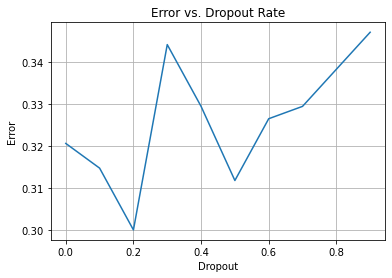

In [40]:
plt.plot(dropOut, Errors)
plt.title("Error vs. Dropout Rate")
plt.xlabel("Dropout")
plt.ylabel("Error")
plt.grid()
plt.savefig('DropoutVError.jpg')
plt.show()

In [41]:
#best dropout for augmented data
base_model=VGG16(weights='imagenet',include_top=False)
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x)
x=Dense(1024,activation='relu')(x)
x=Dropout(0.1)(x)
x=Dense(512,activation='relu')(x)
preds=Dense(10,activation='softmax')(x)

model=Model(inputs=base_model.input,outputs=preds)

for layer in model.layers[:-5]:
    layer.trainable=False
for layer in model.layers[-5:]:
    layer.trainable=True
    
model.compile("adam",loss="categorical_crossentropy",metrics=["accuracy"])
history_aug = model.fit(X_aug_train,y_aug_train,batch_size=32,epochs=100,validation_data=(X_aug_test,y_aug_test), callbacks=[earlystop_aug])

Epoch 1/100
43/43 [==============================] - 3s 57ms/step - loss: 2.1315 - accuracy: 0.2069 - val_loss: 1.7142 - val_accuracy: 0.3618
Epoch 2/100
43/43 [==============================] - 2s 51ms/step - loss: 1.5161 - accuracy: 0.4551 - val_loss: 1.4036 - val_accuracy: 0.4706
Epoch 3/100
43/43 [==============================] - 2s 51ms/step - loss: 1.2360 - accuracy: 0.5781 - val_loss: 1.2815 - val_accuracy: 0.5265
Epoch 4/100
43/43 [==============================] - 2s 52ms/step - loss: 0.9930 - accuracy: 0.6465 - val_loss: 1.1484 - val_accuracy: 0.6176
Epoch 5/100
43/43 [==============================] - 2s 52ms/step - loss: 0.7597 - accuracy: 0.7349 - val_loss: 1.0424 - val_accuracy: 0.6500
Epoch 6/100
43/43 [==============================] - 2s 52ms/step - loss: 0.6553 - accuracy: 0.7680 - val_loss: 1.1706 - val_accuracy: 0.6294
Epoch 7/100
43/43 [==============================] - 2s 52ms/step - loss: 0.5811 - accuracy: 0.7938 - val_loss: 1.0064 - val_accuracy: 0.6853
Epoch 

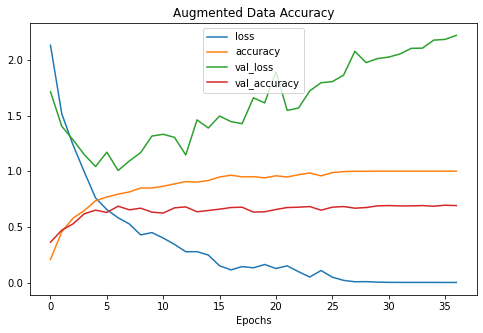

In [42]:
pd.DataFrame(history_aug.history).plot(figsize=(8,5))
plt.title("Augmented Data Accuracy")
plt.xlabel("Epochs")
plt.savefig('best_model_accuracy.jpg')
plt.show()

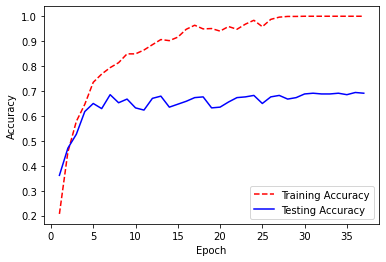

In [43]:
#lets plot the cross validation error as we perform more epochs

accuracy = history_aug.history['accuracy']
val_accuracy = history_aug.history['val_accuracy']

# Create count of the number of epochs
epoch_count = range(1, len(accuracy) + 1)

# Visualize loss history
plt.plot(epoch_count, accuracy, 'r--')
plt.plot(epoch_count, val_accuracy, 'b-')
plt.legend(['Training Accuracy', 'Testing Accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.savefig('accuracy_aug.jpg')
plt.show();

In [44]:
predictions_aug = model.predict(X_aug_test)
label_aug_predictions = encoder.inverse_transform(predictions_aug)

11/11 [==============================] - 0s 39ms/step


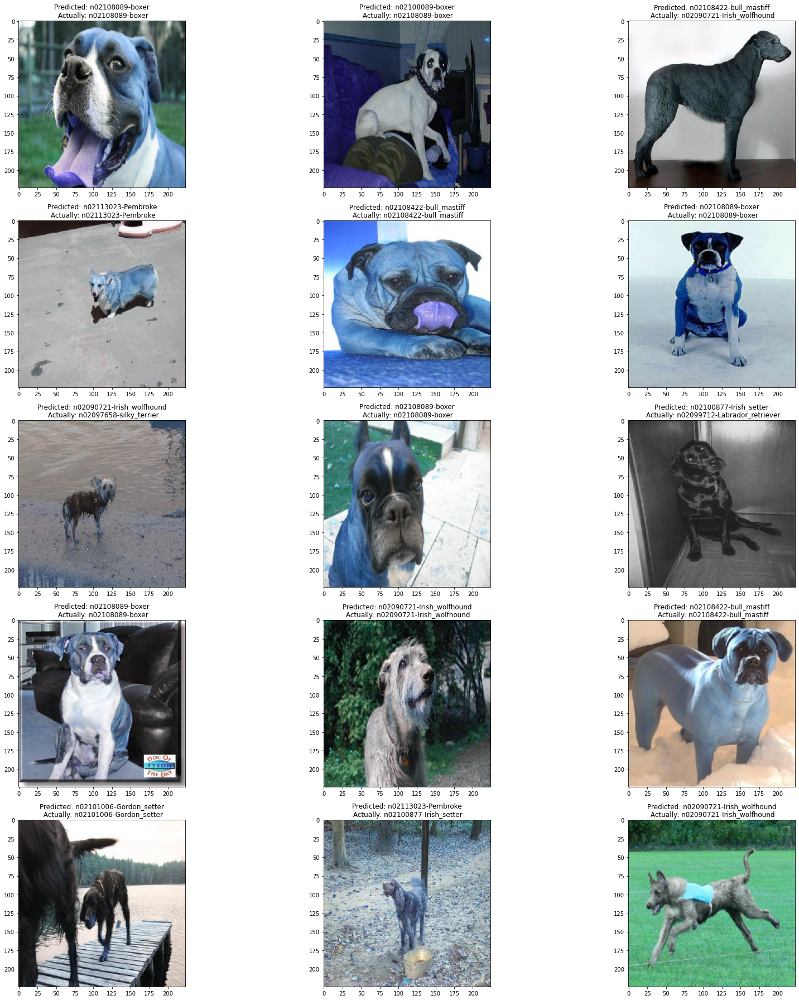

In [45]:
rows, cols = 5, 3
size = 25


fig,ax=plt.subplots(rows,cols)
fig.set_size_inches(size,size)
for i in range(rows):
    for j in range (cols):
        index = np.random.randint(0,len(X_aug_test))
        ax[i,j].imshow(X_aug_test[index])
        ax[i,j].set_title(f'Predicted: {label_aug_predictions[index]}\n Actually: {encoder.inverse_transform(y_aug_test)[index]}')
         
plt.tight_layout()
plt.savefig('img_aug_best_2.png')

1/1 [==============================] - 0s 437ms/step


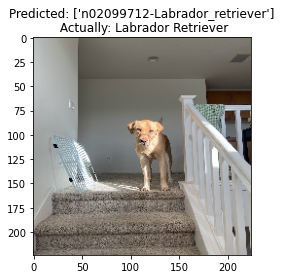

1/1 [==============================] - 0s 11ms/step


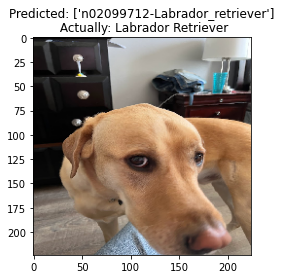

1/1 [==============================] - 0s 11ms/step


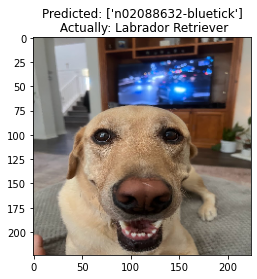

1/1 [==============================] - 0s 11ms/step


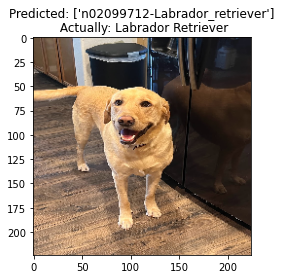

In [46]:
kai_path = "D:/Machine Learning Projects/445Fall2022/Stanford_Dogs/Kai/"

from tensorflow.keras.preprocessing import image


for i in os.listdir(kai_path):
    img = image.load_img(kai_path+'//'+ i, target_size=(224,224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    images = np.vstack([x])
    kai_pred = model.predict(images)
    label_kai_predictions = encoder.inverse_transform(kai_pred) 
    plt.imshow(img)
    plt.title(f'Predicted: {label_kai_predictions}\n Actually: Labrador Retriever')
    plt.savefig('kai_test.jpg' + i)
    plt.show()
    



In [47]:
tf.keras.utils.plot_model(model, show_shapes=True)
plt.savefig('Model_shape.jpg')

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


<Figure size 432x288 with 0 Axes>